In [1]:
# !pip install datasets
#!pip install numpy

In [2]:
import pandas as pd 
from datasets import load_dataset
from tqdm import tqdm
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import umap
from grid_plot_umap import UmapOptimization
import pickle
from sklearn.neighbors import KernelDensity
from scipy.spatial import ConvexHull
import os


# 1.Import Data

In [4]:
# ดาวน์โหลดและโหลดชุดข้อมูลจาก Hugging Face Datasets
df = pd.read_parquet("gems.parquet")# แสดงตัวอย่างข้อมูลจากชุด 'train'
df

,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
3,Gemstone_4,Colored Stones and Pearls,Figure 1. 3D reconstructions of the internal s...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...
3549,Trend_51,"Fashion Jewelry Market Situation in China, 2025",1. Overview of the Fashion Jewelry Market in C...,2023,Ditp_admin2 Ditp_admin2,Trend,2024-06-25 15:51:29.244943,https://www.ditp.go.th/contents_attach/894894/...
3550,Trend_52,Trends in the Jewelry and Accessories Market i...,1. Importation of Gems and Jewelry by Shenzhen...,2023,Ditp_admin2 Ditp_admin2,Trend,2024-06-25 15:51:29.244943,https://www.ditp.go.th/contents_attach/890357/...
3551,Trend_53,Fashion Jewelry Consumption Trends in the Chin...,Due to the emergence of a new consumer group i...,2023,Ditp_admin2 Ditp_admin2,Trend,2024-06-25 15:51:29.244943,https://www.ditp.go.th/contents_attach/858531/...
3552,Trend_54,Jewelry sales have slightly decreased.,From data compiled by experts at the leading j...,2023,Ditp_admin2 Ditp_admin2,Trend,2024-06-25 15:51:29.244943,https://www.ditp.go.th/contents_attach/822652/...


## 1.1 Process Data

In [6]:
df2 = pd.read_parquet('extract_research_nacre_jewelry.parquet')


In [7]:
df2 = df2.rename(columns={'title': 'Title',
                           'abstract': 'Abstract',
                           'pub_year': 'Publication Year',
                           'relative_date': 'Datetime',
                           'authors_list': 'Authors',
                           'link': 'Link',
                           'keyword':'Keyword'})

#df2_final = df2.drop(columns=['title', 'abstract', 'pub_year', 'authors_list', 'link'])


In [8]:
df2 = df2[df2['Abstract'].notna()]

In [9]:
df2

,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,nacre_jewelry_2,"Extraction, Purification, Bioactivities and Ap...",Natural pearls are formed when sand or parasit...,9,"[Huajun Ruan, Yan Wang, Xianguo Zou, Jingying ...",nacre_jewelry,2024-07-18T13:47:04.734609,https://www.researchgate.net/publication/35100...
1,nacre_jewelry_0,An Environmental History of Nacre and Pearls: ...,Pearls are the most ancient gems known in hist...,2009,"[Micheline Cariño, Centro de Investigaciones B...",nacre_jewelry,2024-07-18T13:47:16.180408,https://www.researchgate.net/publication/30533...
2,nacre_jewelry_4,Use of information-seeking strategies for deve...,Efficient library searches for research eviden...,2006,"[Ralf Schlosser, Oliver Wendt, Suresh K Bhavna...",nacre_jewelry,2024-07-18T13:47:17.949156,https://www.researchgate.net/publication/67461...
3,nacre_jewelry_6,"MOLLUSCS: THEIR USAGE AS NUTRITION, MEDICINE, ...",The present study has evaluated the usage and ...,2018,"[Dicle University, Sirnak Üniversitesi, İhsan ...",nacre_jewelry,2024-07-18T13:47:23.166367,https://www.researchgate.net/publication/36632...
4,nacre_jewelry_7,Organic–inorganic interfaces and spiral growth...,"Nacre, the crown jewel of natural materials, h...",6,"[Franz Sauer, Harvard University, Xi'an Univer...",nacre_jewelry,2024-07-18T13:47:35.511694,https://www.researchgate.net/publication/23219...
...,...,...,...,...,...,...,...,...
110,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"[University of Haifa, Inbar Ktalav]",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
111,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"[Hershey H. Friedman, City University of New Y...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
113,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"[Gemological Institute of America, Russell Shor]",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
114,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"[Norwegian Institute for Nature Research, Inst...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


In [10]:
df = pd.concat([df, df2], axis=0)
df

,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
3,Gemstone_4,Colored Stones and Pearls,Figure 1. 3D reconstructions of the internal s...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...
110,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"[University of Haifa, Inbar Ktalav]",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
111,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"[Hershey H. Friedman, City University of New Y...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
113,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"[Gemological Institute of America, Russell Shor]",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
114,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"[Norwegian Institute for Nature Research, Inst...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


In [11]:
df.reset_index(inplace=True)

In [12]:
df['Authors'] = df['Authors'].apply(lambda x: ', '.join(x) if isinstance(x, (list, np.ndarray)) else x)


In [13]:
df.to_parquet('data_gems_3.parquet')

In [14]:
df = pd.read_parquet('data_gems_3.parquet')
df

,index,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
3,3,Gemstone_4,Colored Stones and Pearls,Figure 1. 3D reconstructions of the internal s...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,4,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...,...
3641,110,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"University of Haifa, Inbar Ktalav",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
3642,111,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"Hershey H. Friedman, City University of New Yo...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
3643,113,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"Gemological Institute of America, Russell Shor",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
3644,114,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"Norwegian Institute for Nature Research, Insti...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


In [15]:
df.drop(['index'], axis=1)

,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
3,Gemstone_4,Colored Stones and Pearls,Figure 1. 3D reconstructions of the internal s...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...
3641,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"University of Haifa, Inbar Ktalav",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
3642,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"Hershey H. Friedman, City University of New Yo...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
3643,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"Gemological Institute of America, Russell Shor",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
3644,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"Norwegian Institute for Nature Research, Insti...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


In [16]:
df['Abstract'] = df['Abstract'].astype(str)

In [17]:
import re 
pattern = re.compile(r'\bpdf\b', re.IGNORECASE)
mask = df['Abstract'].apply(lambda x: bool(pattern.search(x)))
df_filtered = df[~mask]
df_filtered

,index,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,4,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
5,5,Gemstone_6,Books: Bright Lights in the Dark Ages: The Tha...,"By Noël Adams, hardcover, 432 pp., illus., pub...","('Fall', '2015')",Donna Beaton,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...,...
3641,110,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"University of Haifa, Inbar Ktalav",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
3642,111,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"Hershey H. Friedman, City University of New Yo...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
3643,113,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"Gemological Institute of America, Russell Shor",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
3644,114,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"Norwegian Institute for Nature Research, Insti...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


In [18]:
df = df_filtered
df.drop(['index'], axis=1)

,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
5,Gemstone_6,Books: Bright Lights in the Dark Ages: The Tha...,"By Noël Adams, hardcover, 432 pp., illus., pub...","('Fall', '2015')",Donna Beaton,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...
3641,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"University of Haifa, Inbar Ktalav",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
3642,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"Hershey H. Friedman, City University of New Yo...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
3643,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"Gemological Institute of America, Russell Shor",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
3644,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"Norwegian Institute for Nature Research, Insti...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


In [19]:
df.reset_index(inplace=True)

In [20]:
df.drop(['index','level_0'], axis=1)

,id,Title,Abstract,Publication Year,Authors,Keyword,Datetime,Link
0,Gemstone_1,Pre-Columbian Gems and Ornamental Materials fr...,Two archeological sites that were discovered r...,"('Fall', '2000')","A. Reg Murphy, David J. Hozjan, and Christy N....",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
1,Gemstone_2,Ornamental Jadeites from the Levoketchpel Depo...,Figure 1. Five of the 10 jadeite samples from ...,"('Summer', '2019')","Makoto Miura, Shoji Arai, Satoko Ishimaru, and...",Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
2,Gemstone_3,Colored Stones and Pearls,Figure 1. A single tourmaline fiber contains t...,"('Fall', '2018')",No authors found,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
3,Gemstone_5,Exhibition Review: Ornamental Traditions: Jewe...,Figure 1. Paisley earrings ca. 1885. Gilt silv...,"('Winter', '2018')",Jennifer-Lynn Archuleta,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
4,Gemstone_6,Books: Bright Lights in the Dark Ages: The Tha...,"By Noël Adams, hardcover, 432 pp., illus., pub...","('Fall', '2015')",Donna Beaton,Gemstone,2024-06-25 15:51:29.244943,http://www.gia.edu/sites/Satellite?c=Page&cid=...
...,...,...,...,...,...,...,...,...
3208,nacre_jewelry_155,Button waste and religious souvenirs in the Ho...,Over 800 shell remains from the late Ottoman a...,2015,"University of Haifa, Inbar Ktalav",nacre_jewelry,2024-07-18T13:58:22.317184,https://www.researchgate.net/publication/28109...
3209,nacre_jewelry_156,The New Media Technologies: Overview and Resea...,The so-called new media technologies - often r...,2008,"Hershey H. Friedman, City University of New Yo...",nacre_jewelry,2024-07-18T13:58:25.095737,https://www.researchgate.net/publication/22819...
3210,nacre_jewelry_158,From Single Source to Global Free Market: the ...,Over the past 15 years a combination of market...,2007,"Gemological Institute of America, Russell Shor",nacre_jewelry,2024-07-18T13:58:35.595113,https://www.researchgate.net/publication/27467...
3211,nacre_jewelry_161,"Yes, it turns: Experimental evidence of pearl ...",Cultured pearls are human creations formed by ...,2,"Norwegian Institute for Nature Research, Insti...",nacre_jewelry,2024-07-18T13:58:58.676673,https://www.researchgate.net/publication/28112...


## 1.2 EDA

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3213 entries, 0 to 3212
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   level_0           3213 non-null   int64 
 1   index             3213 non-null   int64 
 2   id                3213 non-null   object
 3   Title             3213 non-null   object
 4   Abstract          3213 non-null   object
 5   Publication Year  3213 non-null   object
 6   Authors           3203 non-null   object
 7   Keyword           3213 non-null   object
 8   Datetime          3213 non-null   object
 9   Link              3213 non-null   object
dtypes: int64(2), object(8)
memory usage: 251.1+ KB


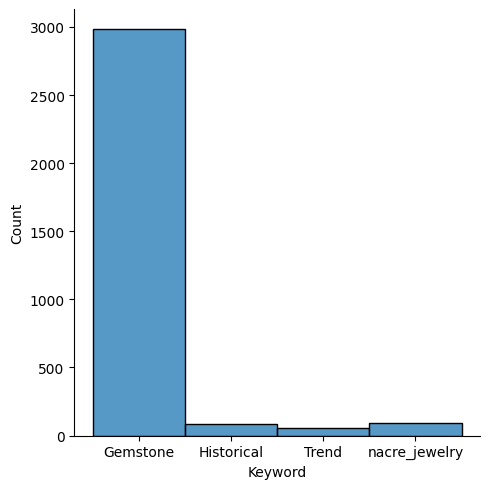

In [23]:
sns.displot(df, x="Keyword")

# 2.Process

## 2.1 

In [26]:
df['data_display'] = "id: " + df['id'].astype(str) + " Title: " + df['Title'].astype(str)+ " Keyword: " + df['Keyword'].astype(str) + " Abstract: " + df['Abstract'].astype(str)
df['data_process'] = df['Abstract'].astype(str)

C:\Users\user\AppData\Local\Temp\ipykernel_29488\4100906683.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['data_display'] = "id: " + df['id'].astype(str) + " Title: " + df['Title'].astype(str)+ " Keyword: " + df['Keyword'].astype(str) + " Abstract: " + df['Abstract'].astype(str)
C:\Users\user\AppData\Local\Temp\ipykernel_29488\4100906683.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['data_process'] = df['Abstract'].astype(str)


In [27]:
df = df[['data_process','data_display','Keyword','Abstract']]
df

,data_process,data_display,Keyword,Abstract
0,Two archeological sites that were discovered r...,id: Gemstone_1 Title: Pre-Columbian Gems and O...,Gemstone,Two archeological sites that were discovered r...
1,Figure 1. Five of the 10 jadeite samples from ...,id: Gemstone_2 Title: Ornamental Jadeites from...,Gemstone,Figure 1. Five of the 10 jadeite samples from ...
2,Figure 1. A single tourmaline fiber contains t...,id: Gemstone_3 Title: Colored Stones and Pearl...,Gemstone,Figure 1. A single tourmaline fiber contains t...
3,Figure 1. Paisley earrings ca. 1885. Gilt silv...,id: Gemstone_5 Title: Exhibition Review: Ornam...,Gemstone,Figure 1. Paisley earrings ca. 1885. Gilt silv...
4,"By Noël Adams, hardcover, 432 pp., illus., pub...",id: Gemstone_6 Title: Books: Bright Lights in ...,Gemstone,"By Noël Adams, hardcover, 432 pp., illus., pub..."
...,...,...,...,...
3208,Over 800 shell remains from the late Ottoman a...,id: nacre_jewelry_155 Title: Button waste and ...,nacre_jewelry,Over 800 shell remains from the late Ottoman a...
3209,The so-called new media technologies - often r...,id: nacre_jewelry_156 Title: The New Media Tec...,nacre_jewelry,The so-called new media technologies - often r...
3210,Over the past 15 years a combination of market...,id: nacre_jewelry_158 Title: From Single Sourc...,nacre_jewelry,Over the past 15 years a combination of market...
3211,Cultured pearls are human creations formed by ...,"id: nacre_jewelry_161 Title: Yes, it turns: Ex...",nacre_jewelry,Cultured pearls are human creations formed by ...


In [28]:
docs = df['data_process'].tolist()

In [29]:
import re
import syllapy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from tqdm import tqdm
import pandas as pd
from gensim.models.phrases import Phrases, Phraser
import spacy

In [30]:
# Download NLTK resources (one-time setup)
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

# Load spaCy model
nlp = spacy.load('en_core_web_sm')

# Initialize stopwords and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# Preprocessing function
def preprocess_text(doc):
    # Remove URLs and non-alphanumeric characters
    doc = re.sub(r'https?://\S+|www\.\S+|[^\w\s]', '', doc)
    doc = re.sub(r'[^\w\s]', '', doc)

    # Convert to lowercase
    doc = doc.lower()

    # Tokenize
    tokens = word_tokenize(doc)

    # Remove stopwords, short words, and long words
    tokens = [word for word in tokens if word not in stop_words]
    #tokens = [word for word in tokens if syllapy.count(word) <= 3]  # Limit to 3 syllables

    # Join tokens back to a single string for spaCy processing
    doc = ' '.join(tokens)
    doc = nlp(doc)

    # Filter tokens based on POS tags and named entities
    #tokens = [token.lemma_ for token in doc if token.pos_ in ['NOUN', 'PROPN'] or token.ent_type_]

    return tokens

# Apply preprocessing using tqdm for progress visualization
tqdm.pandas(desc="Processing text")
df['processed_documents_s'] = df['data_process'].progress_apply(preprocess_text)
df['data_process'] = df['processed_documents_s'].progress_apply(lambda x: ' '.join(x))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Processing text: 100%|█████████████████████████████████████████████████████████████| 3213/3213 [01:48<00:00, 29.56it/s]
C:\Users\user\AppData\Local\Temp\ipykernel_29488\169552191.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['processed_documents_s'] = df['data_process'].progress_a

## 2.2 Embedding

In [32]:
docs = df['data_process'].to_list()

In [33]:
from sentence_transformers import SentenceTransformer
embedder = SentenceTransformer("all-mpnet-base-v2", device='cpu')

C:\Users\user\miniconda3\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [34]:
vector = embedder.encode(docs, show_progress_bar=True)

Batches:   0%|          | 0/101 [00:00<?, ?it/s]

In [35]:
vector.shape

(3213, 768)

In [36]:
df['vector'] = [i for i in vector]

C:\Users\user\AppData\Local\Temp\ipykernel_29488\1187982336.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['vector'] = [i for i in vector]


## Umap

In [38]:
def generate_scatter_graph(plot_lst, dict_sort):
    entp_list = []
    n = 4
    datas = [dict_sort[i*n:(i+1)*n] for i in range(len(dict_sort)//n)]
    for batch in datas:
        fig, axes = plt.subplots(1, n, figsize=(40,10))
        for i, elm in enumerate(batch):
            idx = elm.get('index')            
            data_tmp = plot_lst[idx]

            # entropy 
            axes[i].contourf(data_tmp.get('xx'), data_tmp.get('yy'), data_tmp.get('grid_density'), cmap=plt.cm.Blues, alpha=0.7)
            # axes[i].scatter(data_tmp.get('x'), data_tmp.get('y'), alpha=0.9, s=0.1) 
            axes[i].scatter(data_tmp.get('x'), data_tmp.get('y'), alpha=0.9, s=20) 
            axes[i].set_title(f"UMAP {data_tmp.get('model_index')} Entropy = {round(data_tmp.get('entropy'), 4)} n_neighbors = {data_tmp.get('n_neighbors')} min_dist = {data_tmp.get('min_dist')} spread = {data_tmp.get('spread')}")
            
        plt.show()

In [39]:
vector = df['vector'].tolist()

In [40]:
# params = {'n_neighbors': [10,40,80,100,150,200],
#          'min_dist':    [0.01,0.1,0.2,0.4],
#          'spread':      [0.4,0.75,0.8,1,4]}

params = {'n_neighbors': [10,40,80,100],
          'min_dist':    [0.01,0.1,0.2,0.3],
          'spread':      [0.4,0.75,0.8,1.0,4.0]}
          
optmizer = UmapOptimization()
optmizer.input(params, np.array(vector))
result = optmizer.output()

  0%|          | 0/80 [00:00<?, ?it/s]

C:\Users\user\miniconda3\lib\site-packages\umap\umap_.py:1394: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
C:\Users\user\miniconda3\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\user\miniconda3\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\user\miniconda3\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\user\miniconda3\lib\site-pack

In [41]:
os.makedirs('./output/umap', exist_ok=True)
with open('./output/umap/grid_models_umap.pkl', 'wb') as f : 
    pickle.dump(result, f)

In [42]:
rs_lst = []
for idx, model in enumerate(result) : 
    i = {}
    params = model.get_params()
    i['x'] = model.embedding_[:,0]
    i['y'] = model.embedding_[:,1]
    i['n_neighbors'] = params.get('n_neighbors')
    i['min_dist'] = params.get('min_dist')
    i['spread'] = params.get('spread')
    i['random_state'] = params.get('random_state')
    i['model_idx'] = idx
    i['model'] = model
    rs_lst.append(i)

with open('./output/umap/annotation_umaps.pkl', 'wb') as f : 
    pickle.dump(rs_lst, f)

In [43]:
df_plot = pd.DataFrame(rs_lst)
df_plot

,x,y,n_neighbors,min_dist,spread,random_state,model_idx,model
0,"[-0.5077347, -0.14388087, 0.63809997, -1.45429...","[1.6058646, 1.9063311, 0.84848243, 1.5058883, ...",10,0.01,0.40,736511,0,"UMAP(min_dist=0.01, n_jobs=1, n_neighbors=10, ..."
1,"[0.63318527, 0.084473394, 2.490417, 2.916764, ...","[0.57404697, 0.25147787, -0.10589986, 4.036595...",10,0.01,0.75,464630,1,"UMAP(min_dist=0.01, n_jobs=1, n_neighbors=10, ..."
2,"[0.9658258, 0.039766133, -0.030377267, 2.28854...","[2.622987, 2.6053643, 0.445854, 3.5966213, 3.6...",10,0.01,0.80,891634,2,"UMAP(min_dist=0.01, n_jobs=1, n_neighbors=10, ..."
3,"[-1.3048898, 2.281073, 3.129125, -2.648736, -2...","[2.3032527, 5.420048, 1.3195856, 1.4757735, 1....",10,0.01,1.00,993140,3,"UMAP(min_dist=0.01, n_jobs=1, n_neighbors=10, ..."
4,"[1.4164466, -3.9311366, 2.5581732, -13.581819,...","[14.4807825, 13.868382, 5.442393, -2.689103, -...",10,0.01,4.00,392130,4,"UMAP(min_dist=0.01, n_jobs=1, n_neighbors=10, ..."
...,...,...,...,...,...,...,...,...
75,"[7.9377265, 7.3761697, 7.550242, 7.936507, 7.7...","[4.588741, 5.40429, 5.6664143, 3.7265968, 3.97...",100,0.30,0.40,58849,75,"UMAP(min_dist=0.3, n_jobs=1, n_neighbors=100, ..."
76,"[13.961288, 12.981958, 12.756502, 14.766831, 1...","[2.628702, 3.3434992, 4.262844, 1.0919976, 1.3...",100,0.30,0.75,44777,76,"UMAP(min_dist=0.3, n_jobs=1, n_neighbors=100, ..."
77,"[14.23903, 12.998295, 12.773242, 15.285771, 15...","[1.7349088, 1.8210274, 2.811334, 0.14813145, 0...",100,0.30,0.80,874287,77,"UMAP(min_dist=0.3, n_jobs=1, n_neighbors=100, ..."
78,"[13.87167, 12.530349, 12.431145, 14.440082, 14...","[2.6094708, 3.6002944, 5.082733, 0.76013494, 0...",100,0.30,1.00,994561,78,"UMAP(min_dist=0.3, n_jobs=1, n_neighbors=100, ..."


In [44]:
df_plot = df_plot[['n_neighbors','spread', 'min_dist']].sort_values(by=['n_neighbors', 'spread', 'min_dist'])
# df_plot = df_plot[['spread', 'entropy','n_neighbors', 'min_dist']].sort_values(by=['spread', 'entropy', 'n_neighbors', 'min_dist'])
# df_plot = df_plot[['entropy','min_dist', 'spread', 'n_neighbors']].sort_values(by=['entropy','min_dist','spread', 'n_neighbors'])
df_plot

,n_neighbors,spread,min_dist
0,10,0.40,0.01
5,10,0.40,0.10
10,10,0.40,0.20
15,10,0.40,0.30
1,10,0.75,0.01
...,...,...,...
78,100,1.00,0.30
64,100,4.00,0.01
69,100,4.00,0.10
74,100,4.00,0.20


In [45]:
data_dict = df_plot.reset_index().to_dict('records')
data_dict

[{'index': 0, 'n_neighbors': 10, 'spread': 0.4, 'min_dist': 0.01},
 {'index': 5, 'n_neighbors': 10, 'spread': 0.4, 'min_dist': 0.1},
 {'index': 10, 'n_neighbors': 10, 'spread': 0.4, 'min_dist': 0.2},
 {'index': 15, 'n_neighbors': 10, 'spread': 0.4, 'min_dist': 0.3},
 {'index': 1, 'n_neighbors': 10, 'spread': 0.75, 'min_dist': 0.01},
 {'index': 6, 'n_neighbors': 10, 'spread': 0.75, 'min_dist': 0.1},
 {'index': 11, 'n_neighbors': 10, 'spread': 0.75, 'min_dist': 0.2},
 {'index': 16, 'n_neighbors': 10, 'spread': 0.75, 'min_dist': 0.3},
 {'index': 2, 'n_neighbors': 10, 'spread': 0.8, 'min_dist': 0.01},
 {'index': 7, 'n_neighbors': 10, 'spread': 0.8, 'min_dist': 0.1},
 {'index': 12, 'n_neighbors': 10, 'spread': 0.8, 'min_dist': 0.2},
 {'index': 17, 'n_neighbors': 10, 'spread': 0.8, 'min_dist': 0.3},
 {'index': 3, 'n_neighbors': 10, 'spread': 1.0, 'min_dist': 0.01},
 {'index': 8, 'n_neighbors': 10, 'spread': 1.0, 'min_dist': 0.1},
 {'index': 13, 'n_neighbors': 10, 'spread': 1.0, 'min_dist': 0

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:13<00:00,  3.32s/it]


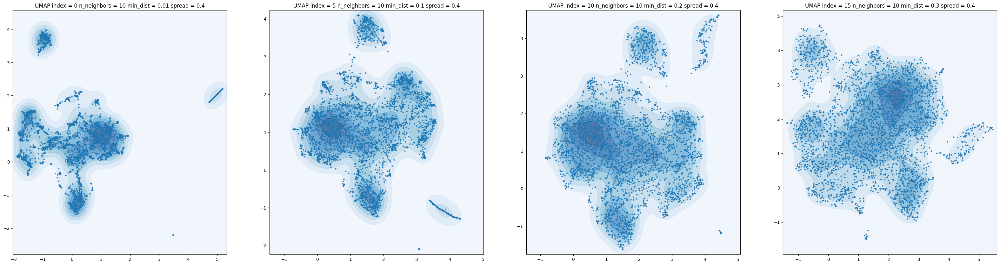

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:10<00:00,  2.61s/it]


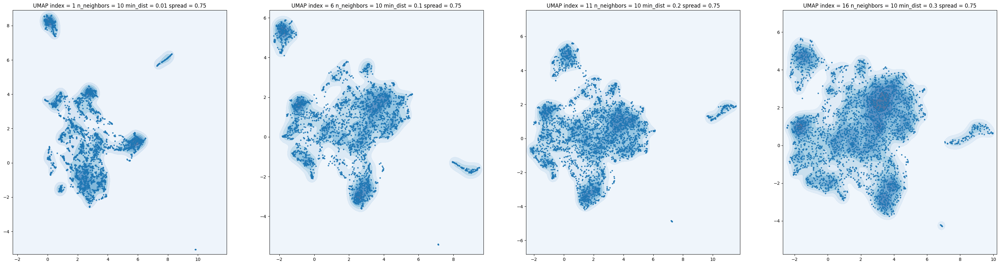

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:10<00:00,  2.60s/it]


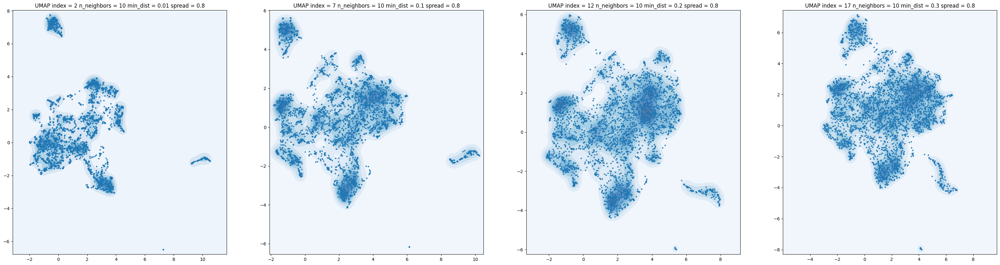

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.77s/it]


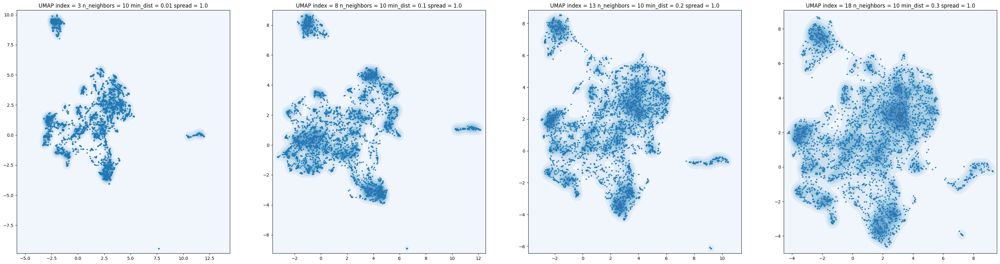

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:08<00:00,  2.20s/it]


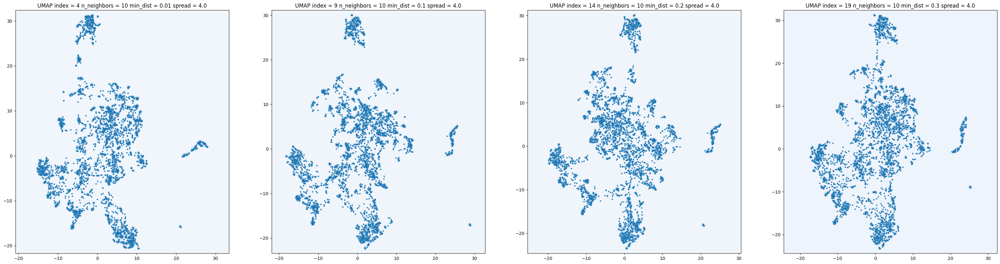

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:16<00:00,  4.01s/it]


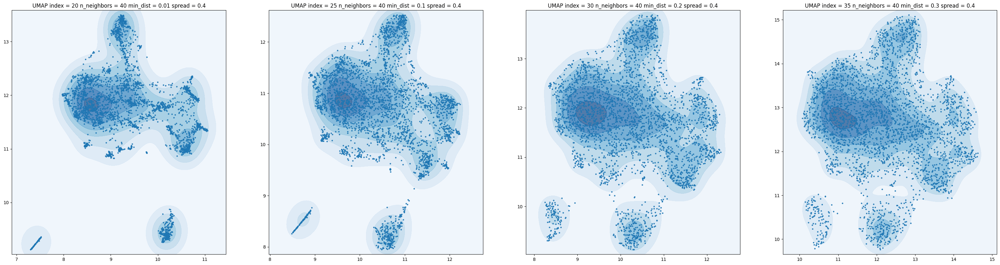

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


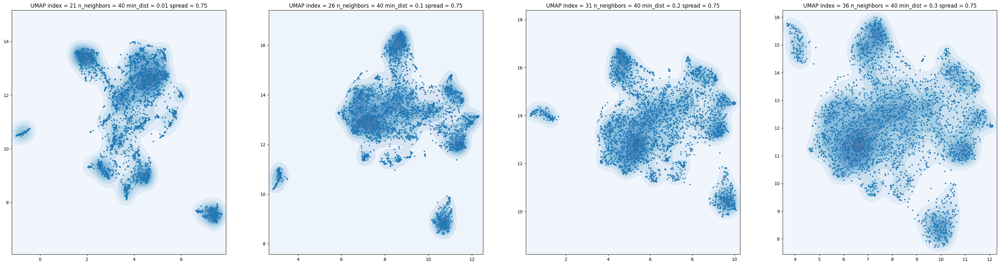

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


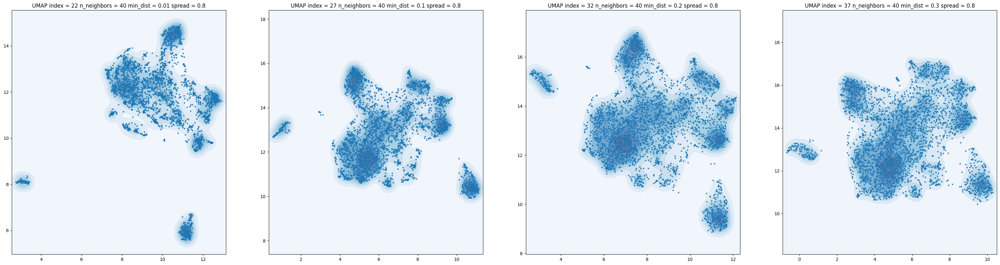

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


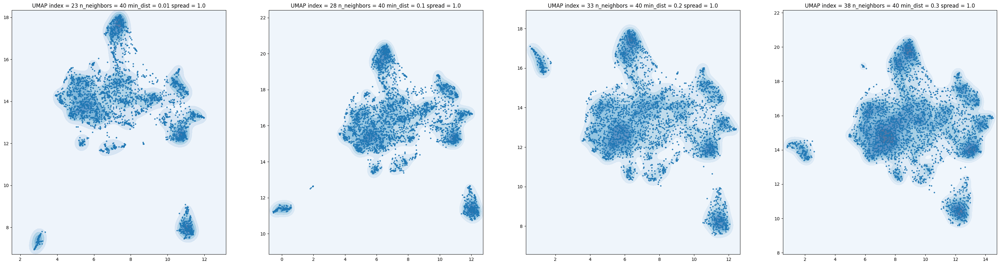

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:08<00:00,  2.21s/it]


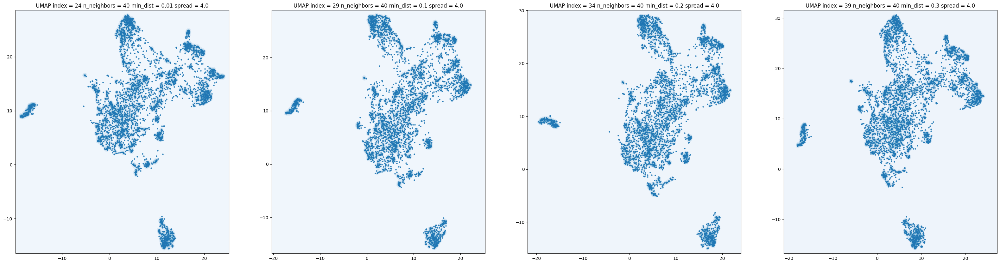

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:16<00:00,  4.24s/it]


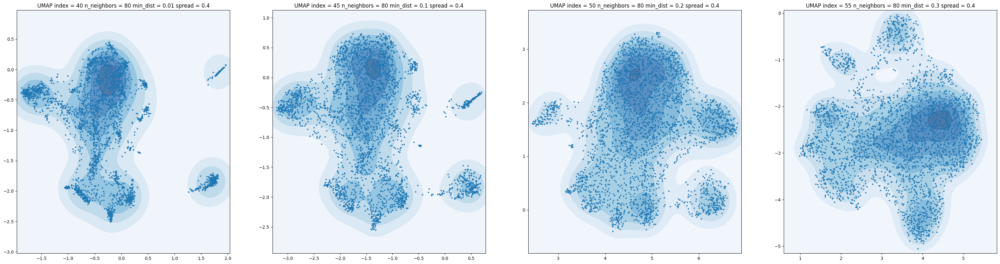

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.16s/it]


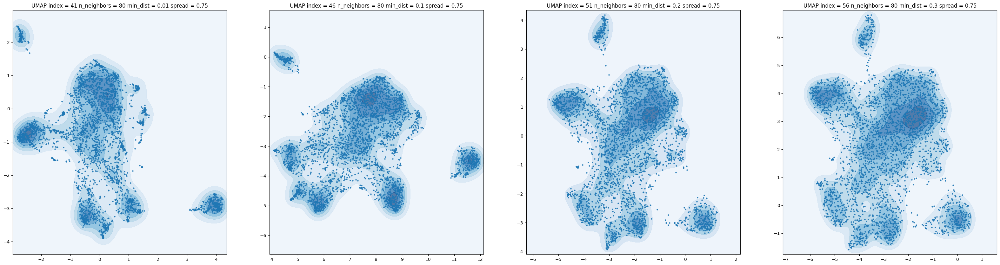

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.17s/it]


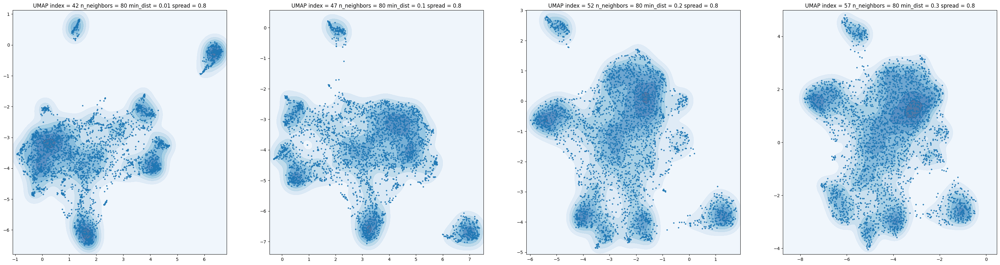

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.89s/it]


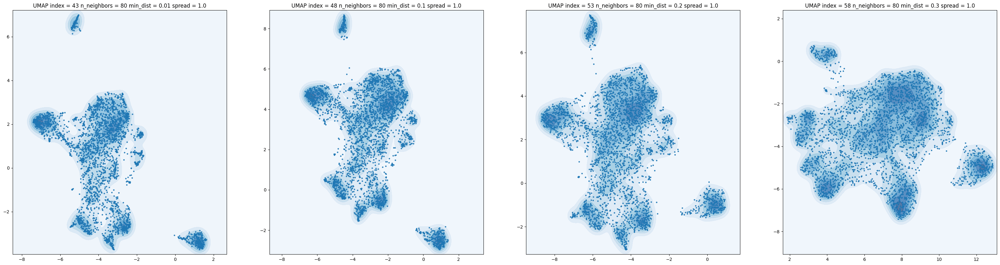

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:09<00:00,  2.31s/it]


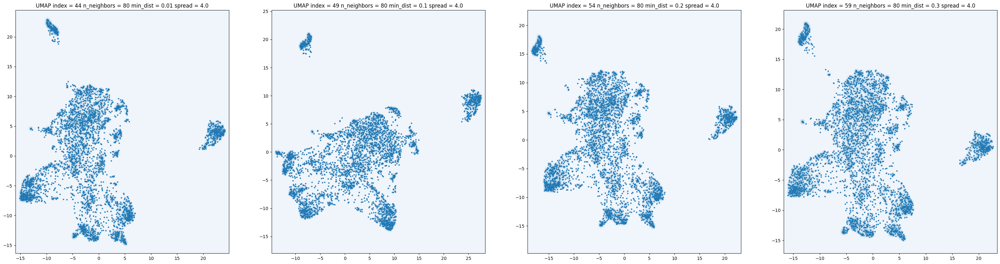

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:17<00:00,  4.37s/it]


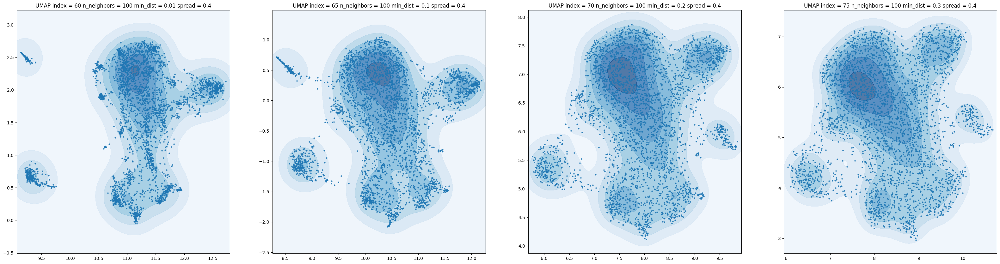

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.20s/it]


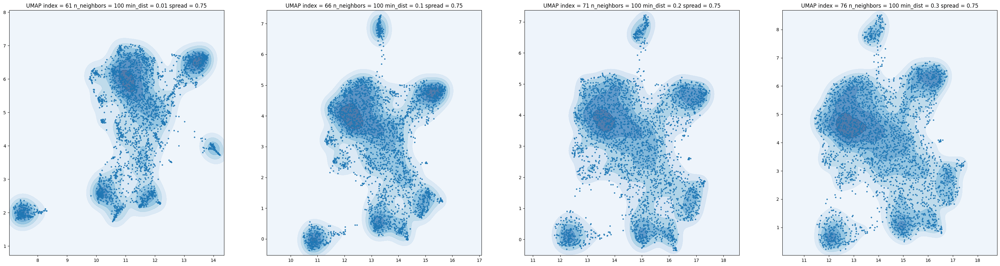

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.12s/it]


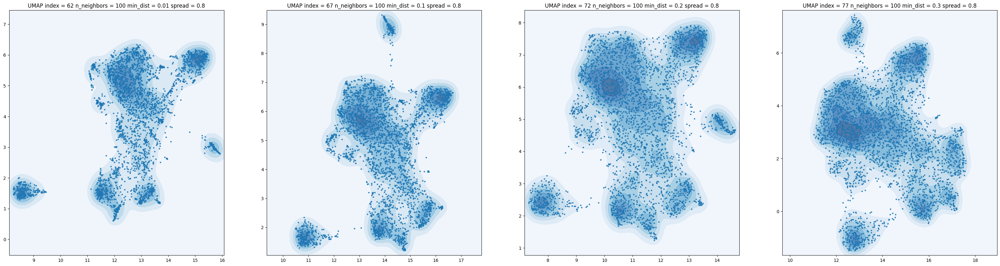

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


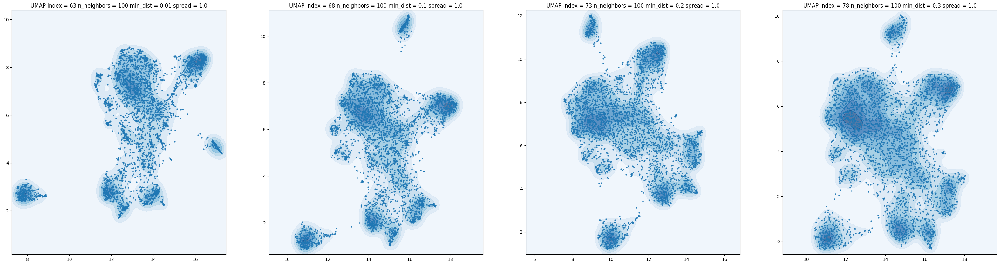

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:08<00:00,  2.24s/it]


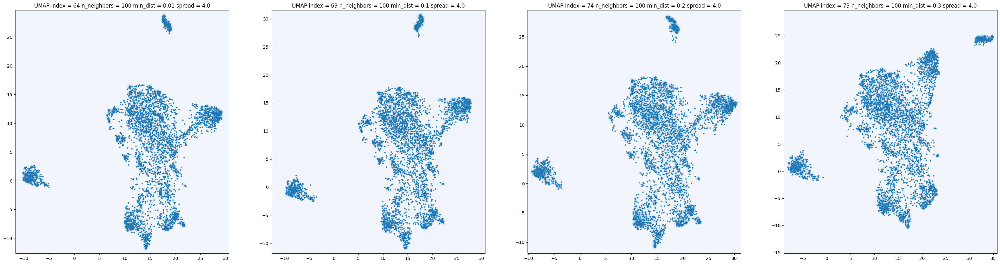

In [46]:
def get_Density(xs, ys, max_sample=100000, SEED=1234, grid_size=200):

    projected_emb = np.stack((xs, ys), axis=1)

    x_min, x_max = np.min(xs), np.max(xs)
    y_min, y_max = np.min(ys), np.max(ys)
    
    x_gap = x_max - x_min
    y_gap = y_max - y_min
    
    if x_gap > y_gap:
    
        # Expand the larger range to leave some padding in the plots
        x_min -= x_gap / 50
        x_max += x_gap / 50
        x_gap = x_max - x_min
        
        # Regulate the 2D grid to be a square
        y_min -= (x_gap - y_gap) / 2
        y_max += (x_gap - y_gap) / 2
        
    else:
        # Expand the larger range to leave some padding in the plots
        y_min -= y_gap / 50
        y_max += y_gap / 50
        y_gap = y_max - y_min
        
        # Regulate the 2D grid to be a square
        x_min -= (y_gap - x_gap) / 2
        x_max += (y_gap - x_gap) / 2
    
    # Estimate on a 2D grid
    grid_xs = np.linspace(x_min, x_max, grid_size)
    grid_ys = np.linspace(y_min, y_max, grid_size)
    xx, yy = np.meshgrid(grid_xs, grid_ys)
    
    grid = np.vstack([xx.ravel(), yy.ravel()]).transpose()

    sample_size = min(max_sample, len(xs))
    n = sample_size
    d = projected_emb.shape[1]
    bw = (n * (d + 2) / 4.)**(-1. / (d + 4))
    
    # We use a random sample to fit the KDE for faster run time
    rng = np.random.RandomState(SEED)
    random_indexes = rng.choice(range(projected_emb.shape[0]),
                                min(projected_emb.shape[0], sample_size),
                                replace=False)
    
    kde = KernelDensity(kernel='gaussian', bandwidth=bw)
    kde.fit(projected_emb[random_indexes, :])

    log_density = kde.score_samples(grid)
    log_density = np.exp(log_density)
    grid_density = np.reshape(log_density, xx.shape)
    
    return grid_density, xx, yy, bw
                                
def generate_scatter_graph(plot_lst, dict_sort, plot_grid=False):
    entp_list = []
    n = 4
    datas = [dict_sort[i*n:(i+1)*n] for i in range(len(dict_sort)//n)]
    for batch in datas:
        fig, axes = plt.subplots(1, n, figsize=(40,10))
        for i, elm in enumerate(tqdm(batch)):
            idx = elm.get('index')            
            data_tmp = plot_lst[idx]
            x = data_tmp.get('x')
            y = data_tmp.get('y')
            if plot_grid : 
                grid_density, xx, yy, bw = get_Density(x,y)
                axes[i].contourf(xx, yy, grid_density, cmap=plt.cm.Blues, alpha=0.7)
            axes[i].scatter(x, y , alpha=0.9, s=5) 
            axes[i].set_title(f"UMAP index = {data_tmp.get('model_idx')} n_neighbors = {data_tmp.get('n_neighbors')} min_dist = {data_tmp.get('min_dist')} spread = {data_tmp.get('spread')}")
            
        plt.show()

generate_scatter_graph(rs_lst, data_dict, True)

In [47]:
# select umap index 4
model_dict = rs_lst[18]

In [48]:
model_dict

{'x': array([-0.93234646,  1.4479489 ,  2.085208  , ..., -3.0024362 ,
        -2.076931  , -2.333379  ], dtype=float32),
 'y': array([3.1182745, 5.434923 , 3.1215415, ..., 5.715909 , 7.686812 ,
        1.2900859], dtype=float32),
 'n_neighbors': 10,
 'min_dist': 0.3,
 'spread': 1.0,
 'random_state': 376650,
 'model_idx': 18,
 'model': UMAP(min_dist=0.3, n_jobs=1, n_neighbors=10, random_state=376650, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})}

In [49]:
model = model_dict.get('model')

In [50]:
df['x'] = model.embedding_[:,0]
df['y'] = model.embedding_[:,1]

C:\Users\user\AppData\Local\Temp\ipykernel_29488\3472645092.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['x'] = model.embedding_[:,0]
C:\Users\user\AppData\Local\Temp\ipykernel_29488\3472645092.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['y'] = model.embedding_[:,1]


In [51]:
#df.to_parquet('process_2.parquet')